In [1]:
import torch
import torchvision
import numpy as np
import seaborn as sn

In [2]:
import os

data_dir = os.getcwd() + '/fruits-360/'
train_dir = data_dir + 'Training/'
test_dir = data_dir + 'Test/'
multi_test_dir = data_dir+'test-multiple_fruits/'

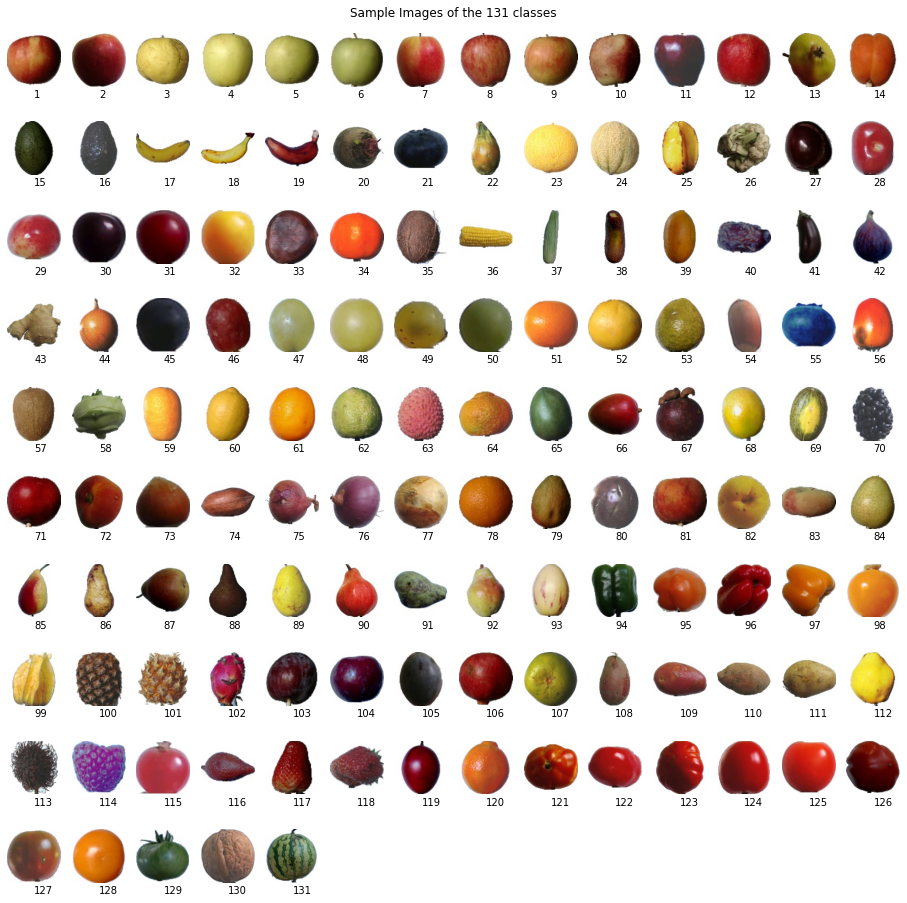

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

classes = os.listdir(train_dir)
classes.sort()
images = []
classesSize = []
for folder in classes:
    imageFiles = os.listdir(train_dir+folder)
    images.append(train_dir+folder+'/'+imageFiles[0])
    classesSize.append(len(imageFiles))
fig = plt.figure(figsize=(16,16))
plt.title(label='Sample Images of the '+str(len(classes))+' classes')
plt.axis('off')
for i, img in enumerate(images):
    fig.add_subplot(10,14,i+1)
    image = mpimg.imread(img)
    plt.imshow(image)
    plt.text(x = 50, y =120, s=str(i+1))
    plt.axis('off')

In [5]:
from torchvision import transforms

transforms = {
    'train': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]),
    'test': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
}

In [6]:
from torchvision import datasets

datasets = {
    'train': datasets.ImageFolder(train_dir, transform=transforms['train']),
    'test': datasets.ImageFolder(test_dir, transform= transforms['test'])
}

In [7]:
trainLoader = torch.utils.data.DataLoader(datasets['train'], batch_size=16, shuffle=True, num_workers=4)
testLoader = torch.utils.data.DataLoader(datasets['test'], batch_size=16, shuffle=False, num_workers=4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Pitahaya Red Pineapple Cucumber Ripe Kumquats Watermelon Cantaloupe 2 Pear Monster Strawberry Wedge Apple Golden 2 Apple Crimson Snow Tomato Yellow Mandarine Physalis with Husk Tomato Maroon Banana Peach Flat


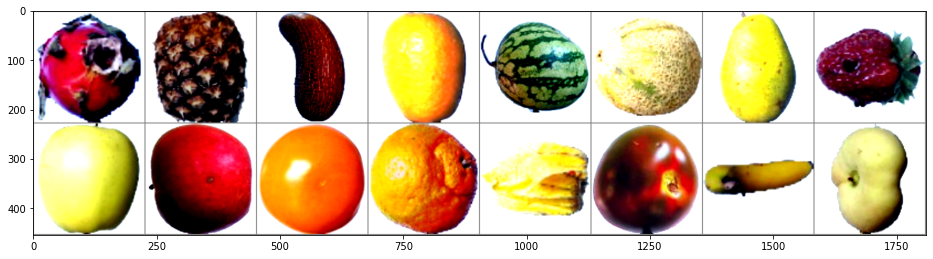

In [8]:
def imshow(img):
    npimg = img.numpy()
    npimgs[:, 0, :, :] = npimgs[:, 0, :, :] * .229 + 0.485
    npimgs[:, 1, :, :] = npimgs[:, 1, :, :] * .224 + 0.456
    npimgs[:, 2, :, :] = npimgs[:, 2, :, :] * .225 + 0.406
    plt.imshow(np.transpose(npimg, (1,2,0)))
plt.figure(figsize=(16,8))
iterator = iter(trainLoader)
images, labels = iterator.next()
imshow(torchvision.utils.make_grid(images))
print(' '.join('%5s' % classes[labels[j]] for j in range(16)))

In [392]:
import numpy as np

def visuallyInspect(model):
    with torch.no_grad():
        iterator = iter(testLoader)
        imgs, labels = iterator.next()
        imgs = imgs.to(device)
        labels = labels.to(device) 
        preds = torch.argmax(F.softmax(model(imgs), dim =1), 1)
        npimgs = imgs.to('cpu').numpy()
        npimgs[:, 0, :, :] = npimgs[:, 0, :, :] * .229 + 0.485
        npimgs[:, 1, :, :] = npimgs[:, 1, :, :] * .224 + 0.456
        npimgs[:, 2, :, :] = npimgs[:, 2, :, :] * .225 + 0.406
        npimgs = np.transpose(npimgs, axes=(0,2,3,1))
        fig = plt.figure(figsize=(20,4))
        for i in range(npimgs.shape[0]):
            fig.add_subplot(2,8,i+1)
            img = npimgs[i]
            img = (img*255).astype(int)
            plt.imshow(img)
            pred = preds[i]
            label = labels[i]
            correct = pred == label
            if correct : 
                color = 'green'
            else : 
                color = 'red'
            plt.text(x = 10, y = 240, s=classes[pred], fontsize = 10, bbox=dict(facecolor=color, alpha=0.5))
            plt.axis('off')

In [393]:
def plotData(history):
    acc = history['acc']
    val_acc = history['val_acc']
    epochs = np.arange(0,len(acc))
    loss = history['loss']
    val_loss = history['val_loss']
    fig = plt.figure(figsize=(20,5))

    fig.add_subplot(1,2,1)
    plt.title('Accuracy over Epochs')
    plt.plot(epochs, acc, label='Train Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.ylim(bottom=0)
    plt.legend()
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')

    fig.add_subplot(1,2,2)
    plt.title('Loss over Epochs')
    plt.plot(epochs, loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.ylim(bottom=0)
    plt.legend()
    plt.ylabel('Loss')
    plt.xlabel('Epochs')

In [396]:
import seaborn as sn
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score, confusion_matrix
def confusionMatrix(model):
    with torch.no_grad():
        predictions = np.zeros((0,1))
        labels = np.zeros((0,1))
        for i, data in enumerate(testLoader, 0):
            image, label = data[0].to(device), data[1].to(device)
            pred = torch.argmax(F.softmax(model(image), dim=1), 1)
            label = label.to('cpu').numpy()
            pred = pred.to('cpu').numpy()
            pred = np.reshape(pred, (16,1))
            label = np.reshape(label, (16,1))
            predictions = np.concatenate((predictions,pred),axis=0)
            labels = np.concatenate((labels, label), axis=0)
        labels = np.reshape(np.transpose(labels), (labels.shape[0]))
        predictions = np.reshape(np.transpose(predictions), (predictions.shape[0]))
        confusionMatrix = confusion_matrix(labels, predictions)
        f1 = f1_score(labels, predictions, average='weighted')
        recall = recall_score(labels, predictions, average='weighted')
        accuracy = accuracy_score(labels, predictions)
        percisison = precision_score(labels, predictions, average='weighted')
        plt.figure(figsize=(30,20))
        sn.set(font_scale=1.4)
        sn.heatmap(confusionMatrix, annot=False)
        plt.text(0, 150, s = 'F1: '+str(f1))
        plt.text(50, 150, s = 'Recall: '+str(recall))
        plt.text(100,150, s = 'Percision: '+str(percisison))
        plt.text(150, 150, s = 'Accuracy: '+str(accuracy))
        plt.show()

In [397]:
device = torch.device("cuda:0")

In [426]:
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary

class Small_Model(nn.Module):
    def __init__(self):
        super(Small_Model, self).__init__()
        self.conv1 = nn.Conv2d(3,16,3, padding=1)
        self.pool = nn.MaxPool2d(2,2)
        self.conv2 = nn.Conv2d(16,32,3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3)
        self.fc1 = nn.Linear(64*27*27, 1024)
        self.fc2 = nn.Linear(1024, 131)
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(-1, 64*28*28)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x
small_model = Small_Model().to(device)
summary(small_model, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 224, 224]             448
         MaxPool2d-2         [-1, 16, 112, 112]               0
            Conv2d-3         [-1, 32, 112, 112]           4,640
         MaxPool2d-4           [-1, 32, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          18,496
         MaxPool2d-6           [-1, 64, 28, 28]               0
            Linear-7                 [-1, 1024]      51,381,248
            Linear-8                  [-1, 131]         134,275
Total params: 51,539,107
Trainable params: 51,539,107
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 13.41
Params size (MB): 196.61
Estimated Total Size (MB): 210.59
----------------------------------------------------------------


In [ ]:
class DropoutModel2(nn.Module):
    def __init__(self):
        super(DropoutModel2, self).__init__()
        self.conv1 = nn.Conv2d(3,16,3, padding=1)
        self.pool = nn.MaxPool2d(2,2)
        self.conv2 = nn.Conv2d(16,32,3, padding=1)
        self.conv3 = nn.Conv2d(32,64, 3, padding=1)
        self.conv4 = nn.Conv2d(64,128,3, padding=1)
        self.dropout1 = nn.Dropout(p = 0.3)
        self.fc1 = nn.Linear(25088, 150)
        self.dropout2 = nn.Dropout(p=0.4)
        self.fc2 = nn.Linear(150, 131)
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))
        x = x.view(-1,25088)
        x = self.dropout1(x)
        x = F.relu(self.fc1(x))
        x = self.dropout2(x)
        x = self.fc2(x)
        return x
dropout_model2 = DropoutModel2().to(device)
summary(dropout_model2, (3,224,224))

In [400]:
class Transfer_Model(nn.Module):
    def __init__(self):
        super(Transfer_Model, self).__init__()
        self.network = torchvision.models.resnet50(pretrained=True)
        self.network.fc = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Linear(1024,131)
        )
    def forward(self, x):
        x = self.network(x)
        return x
    def freeze(self):
        for param in self.network.parameters():
            param.requires_grad = False
        for param in self.network.fc.parameters():
            param.requires_grad = True
    def unfreeze(self):
        for param in self.network.parameters():
            param.requires_grad = True

transfer_model = Transfer_Model().to(device)
summary(transfer_model, (3, 224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [442]:
def eval(model, testLoader):
    val_loss =0.0
    val_acc = 0.0
    with torch.no_grad():
        for i, data in enumerate(testLoader,0):
            inputs, labels = data[0].to(device), data[1].to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            pred = torch.max(outputs.data, 1)[1]
            val_loss += loss.item()
            val_acc += (pred == labels).sum().cpu().item()
        val_loss = val_loss/1418.0
        val_acc = val_acc/1418.0/16.0
        print('val_loss: '+str(val_loss)+'  '+'val_acc: '+str(val_acc))
    return val_loss, val_acc

In [443]:
def train(model, optimizer, epochs, loss, filename, history = {'loss':[], 'val_loss': [], 'acc': [], 'val_acc':[]}):
    best_loss = float('inf')
    for epoch in range(epochs):
        running_loss = 0.0
        val_loss = 0.0
        running_acc = 0.0
        val_acc = 0.0
        for i, data in enumerate(trainLoader, 0):
            inputs, labels = data[0].to(device), data[1].to(device)
            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            with torch.no_grad():
                pred = torch.max(outputs.data, 1)[1]
                running_acc += (pred==labels).sum().cpu().item()
                running_loss += loss.item()
                if i % 500 == 499:    
                    print('[%d, %5d] loss: %.4f  accuracy: %.4f' %(epoch + 1, i + 1, running_loss / (i+1), running_acc/(i+1)/16))

        running_loss = running_loss/4231
        running_acc = running_acc/4231/16
        print('[%d, %5d] loss: %.4f  accuracy: %.4f' %(epoch + 1, i + 1, running_loss, running_acc))
        val_loss, val_acc = eval(model,testLoader)

        history['loss'].append(running_loss)
        history['acc'].append(running_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        if(val_loss < best_loss):
            print('Saving model new lowest val_loss: %.4f' % (val_loss))
            best_loss = val_loss
            torch.save(model.state_dict(), filename)
        else:
            print('Not Saving: val_loss: %.4f is worse than best_loss: %.4f' % (val_loss, best_loss))
    print('Finished Training')
    return history

In [444]:
small_model = Small_Model().to(device)

In [445]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(small_model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-7)

In [446]:
history = train(small_model, optimizer, 15, criterion, 'small_model.pb')

[1,   500] loss: 1.8932  accuracy: 0.5222
[1,  1000] loss: 1.1090  accuracy: 0.7124
[1,  1500] loss: 0.8035  accuracy: 0.7895
[1,  2000] loss: 0.6369  accuracy: 0.8322
[1,  2500] loss: 0.5304  accuracy: 0.8596
[1,  3000] loss: 0.4603  accuracy: 0.8780
[1,  3500] loss: 0.4072  accuracy: 0.8918
[1,  4000] loss: 0.3617  accuracy: 0.9040
[1,  4231] loss: 0.3470  accuracy: 0.9077
val_loss: 0.5513525060075893  val_acc: 0.859441114245416
Saving model new lowest val_loss: 0.5514
[2,   500] loss: 0.0655  accuracy: 0.9819
[2,  1000] loss: 0.0722  accuracy: 0.9791
[2,  1500] loss: 0.0777  accuracy: 0.9797
[2,  2000] loss: 0.0799  accuracy: 0.9789
[2,  2500] loss: 0.0767  accuracy: 0.9799
[2,  3000] loss: 0.0678  accuracy: 0.9821
[2,  3500] loss: 0.0665  accuracy: 0.9826
[2,  4000] loss: 0.0651  accuracy: 0.9830
[2,  4231] loss: 0.0648  accuracy: 0.9831
val_loss: 0.5178141305354464  val_acc: 0.9025476022566996
Saving model new lowest val_loss: 0.5178
[3,   500] loss: 0.0500  accuracy: 0.9869
[3,  

KeyboardInterrupt: 

In [154]:
small_model = small_model().to(device)
net.load_state_dict(torch.load('small_model.pb'))
_, _ = eval(small_model,testLoader)

val_loss: 0.21052393251413662  val_acc: 0.952574047954866


In [ ]:
plotData(history)

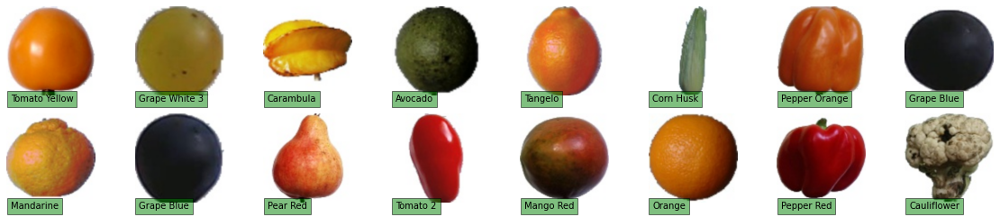

In [225]:
visuallyInspect(small_model)

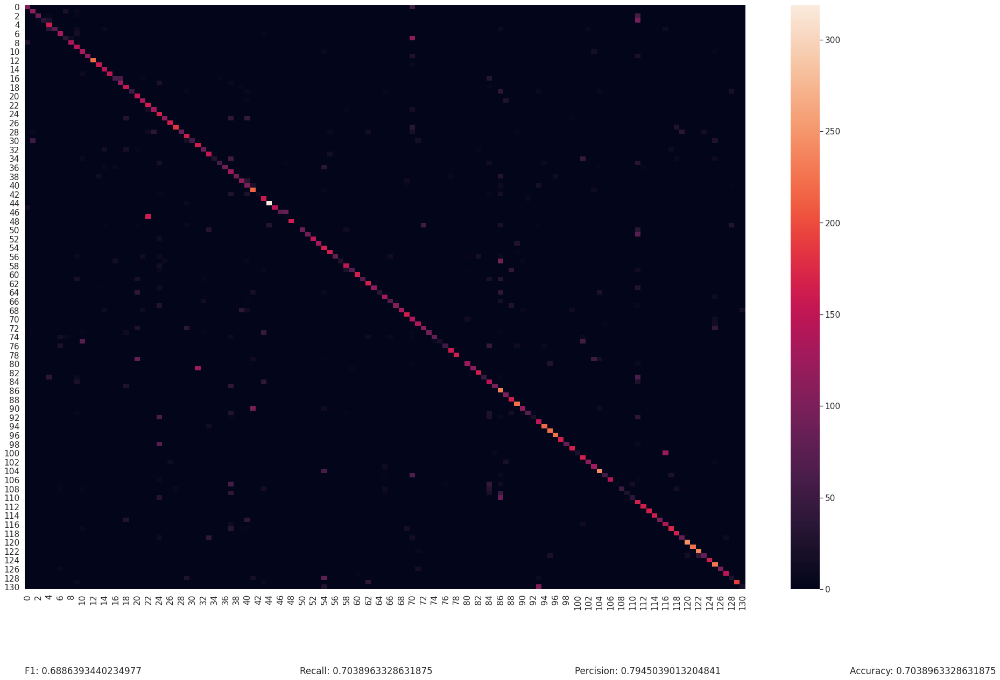

In [324]:
confusionMatrix(small_model)

In [230]:
print(torchvision.models.resnet50(pretrained=True).to(device), (3,224,224))

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [259]:
optimizer = optim.Adam(transfer_model.parameters())
criterion = nn.CrossEntropyLoss()

In [273]:
history = train(transfer_model, optimizer,10, criterion, 'transfer_model')

[1,  1000] loss: 0.0282  accuracy: 0.9908
[1,  2000] loss: 0.0228  accuracy: 0.9929
[1,  3000] loss: 0.0237  accuracy: 0.9930
[1,  4000] loss: 0.0241  accuracy: 0.9929
[1,  4231] loss: 0.0242  accuracy: 0.9928
val_loss: 0.1913130075644261  val_acc: 0.967031029619182
Saving model New Lowest loss: 0.1913
[2,  1000] loss: 0.0167  accuracy: 0.9953
[2,  2000] loss: 0.0253  accuracy: 0.9928
[2,  3000] loss: 0.0226  accuracy: 0.9936
[2,  4000] loss: 0.0222  accuracy: 0.9937
[2,  4231] loss: 0.0217  accuracy: 0.9938
val_loss: 0.13538420501186427  val_acc: 0.9773007757404796
Saving model New Lowest loss: 0.1354
[3,  1000] loss: 0.0156  accuracy: 0.9962
[3,  2000] loss: 0.0201  accuracy: 0.9948
[3,  3000] loss: 0.0199  accuracy: 0.9946
[3,  4000] loss: 0.0198  accuracy: 0.9946
[3,  4231] loss: 0.0195  accuracy: 0.9946
val_loss: 0.13987826430517097  val_acc: 0.972364245416079
 0.1399 is worse than 0.1354
[4,  1000] loss: 0.0235  accuracy: 0.9933
[4,  2000] loss: 0.0160  accuracy: 0.9952
[4,  3000

In [279]:
transfer_model.load_state_dict(torch.load('transfer_model'))
_, _ = eval(transfer_model, testLoader)

val_loss: 0.12565196074320598  val_acc: 0.9765955571227081


Text(0.5, 0, 'Epochs')

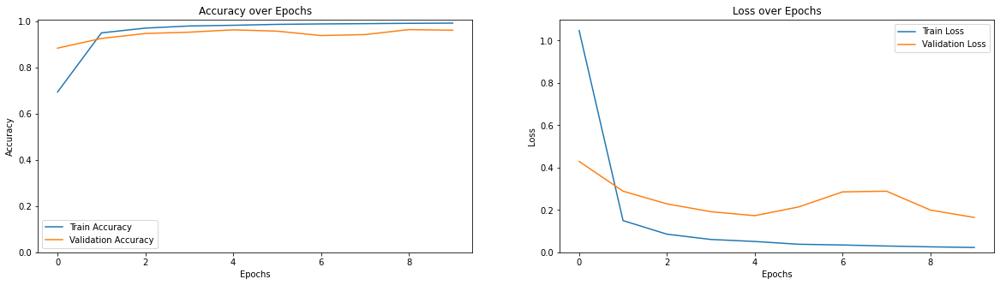

In [267]:
acc = history['acc']
val_acc = history['val_acc']
epochs = np.arange(0,len(acc))
loss = history['loss']
val_loss = history['val_loss']
fig = plt.figure(figsize=(20,5))

fig.add_subplot(1,2,1)
plt.title('Accuracy over Epochs')
plt.plot(epochs, acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.ylim(bottom=0)
plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Epochs')

fig.add_subplot(1,2,2)
plt.title('Loss over Epochs')
plt.plot(epochs, loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.ylim(bottom=0)
plt.legend()
plt.ylabel('Loss')
plt.xlabel('Epochs')

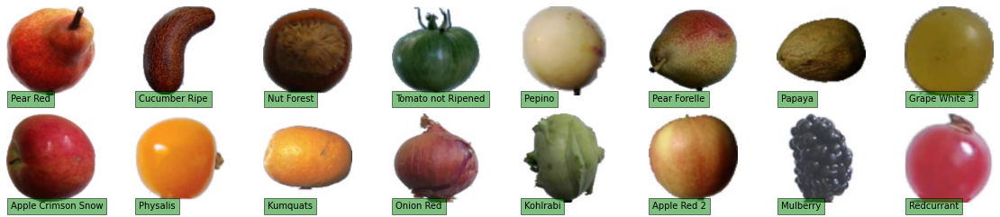

In [288]:
visuallyInspect(transfer_model)

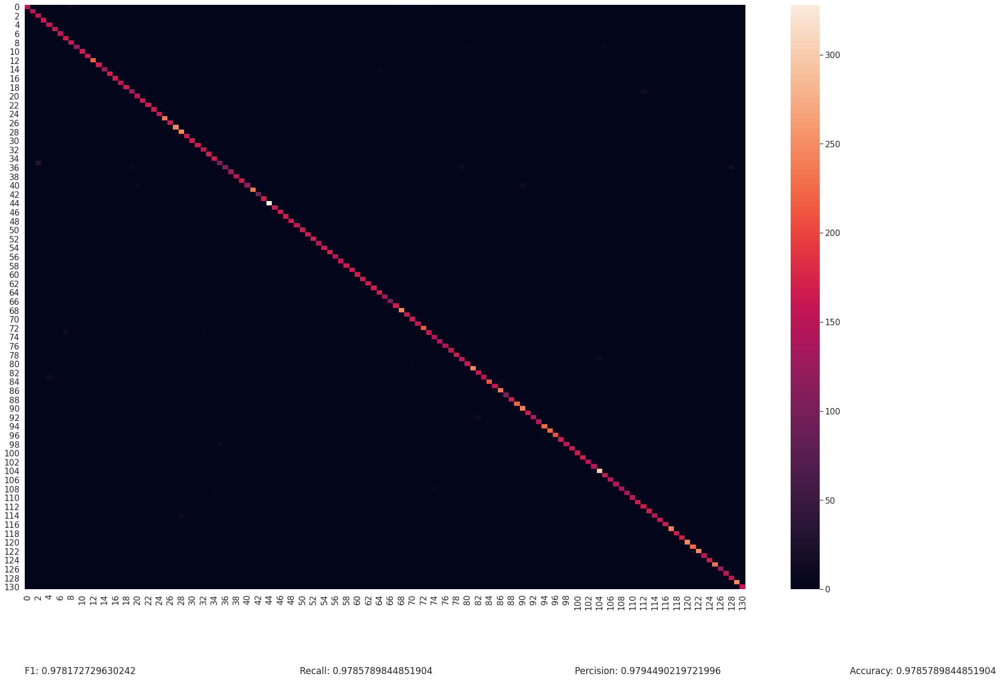

In [323]:
confusionMatrix(transfer_model)

In [359]:
loss = nn.CrossEntropyLoss()
opt = optim.Adam(dropout_model2.parameters())

In [360]:
history = train(dropout_model2, opt, 15, loss, 'dropout_model2')

[1,  1000] loss: 1.5684  accuracy: 0.5931
[1,  2000] loss: 0.9100  accuracy: 0.7564
[1,  3000] loss: 0.6601  accuracy: 0.8209
[1,  4000] loss: 0.5244  accuracy: 0.8564
[1,  4231] loss: 0.5005  accuracy: 0.8627
val_loss: 0.38673337292003646  val_acc: 0.9122884344146686
Saving model New Lowest loss: 0.3867
[2,  1000] loss: 0.0878  accuracy: 0.9724
[2,  2000] loss: 0.0848  accuracy: 0.9736
[2,  3000] loss: 0.0797  accuracy: 0.9754
[2,  4000] loss: 0.0793  accuracy: 0.9760
[2,  4231] loss: 0.0771  accuracy: 0.9767
val_loss: 0.29820641824628824  val_acc: 0.9330483074753173
Saving model New Lowest loss: 0.2982
[3,  1000] loss: 0.0583  accuracy: 0.9839
[3,  2000] loss: 0.0580  accuracy: 0.9836
[3,  3000] loss: 0.0562  accuracy: 0.9841
[3,  4000] loss: 0.0528  accuracy: 0.9850
[3,  4231] loss: 0.0532  accuracy: 0.9848
val_loss: 0.31535527856996853  val_acc: 0.9341502115655853
 0.3154 is worse than 0.2982
[4,  1000] loss: 0.0443  accuracy: 0.9879
[4,  2000] loss: 0.0388  accuracy: 0.9892
[4,  3

{'loss': [0.4763380235254039,
  0.5004858696579896,
  0.07705029169538413,
  0.053211424086036886,
  0.03892944903054396,
  0.03922440440861386,
  0.03269945902556082,
  0.029840856149983185,
  0.03336085470145556,
  0.03170438493005683,
  0.02429465881367334,
  0.03053140785347334,
  0.031622945872538416,
  0.0258547007470266,
  0.027647643622434236,
  0.02660187955137784],
 'val_loss': [0.38673337292003646,
  0.29820641824628824,
  0.31535527856996853,
  0.41440840949767765,
  0.3756203492969565,
  0.3408688878683552,
  0.5336176576675736,
  0.5104617605968385,
  0.7079043965267835,
  0.5423131020897631,
  0.6758153035501819,
  0.6640828336409735,
  0.4759961131305666,
  0.5855153707267056,
  0.8032872512626589],
 'acc': [0.8694605294256676,
  0.862680217442685,
  0.9766899078232096,
  0.984770148900969,
  0.9888176554006145,
  0.9894085322618766,
  0.9921117939021508,
  0.9921856535098086,
  0.9921856535098086,
  0.9932049160954857,
  0.9947855116993618,
  0.9944309855826046,
  0.99

In [361]:
dropout_model2.load_state_dict(torch.load('dropout_model2'))
_, _ = eval(dropout_model2, testLoader)

val_loss: 0.2971116257186983  val_acc: 0.93137341325811


In [ ]:
plotData(history)

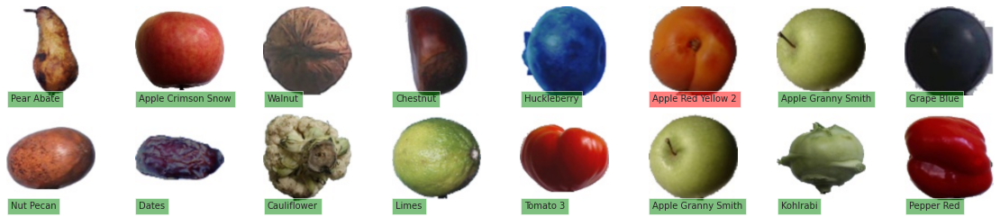

In [362]:
visuallyInspect(dropout_model2)

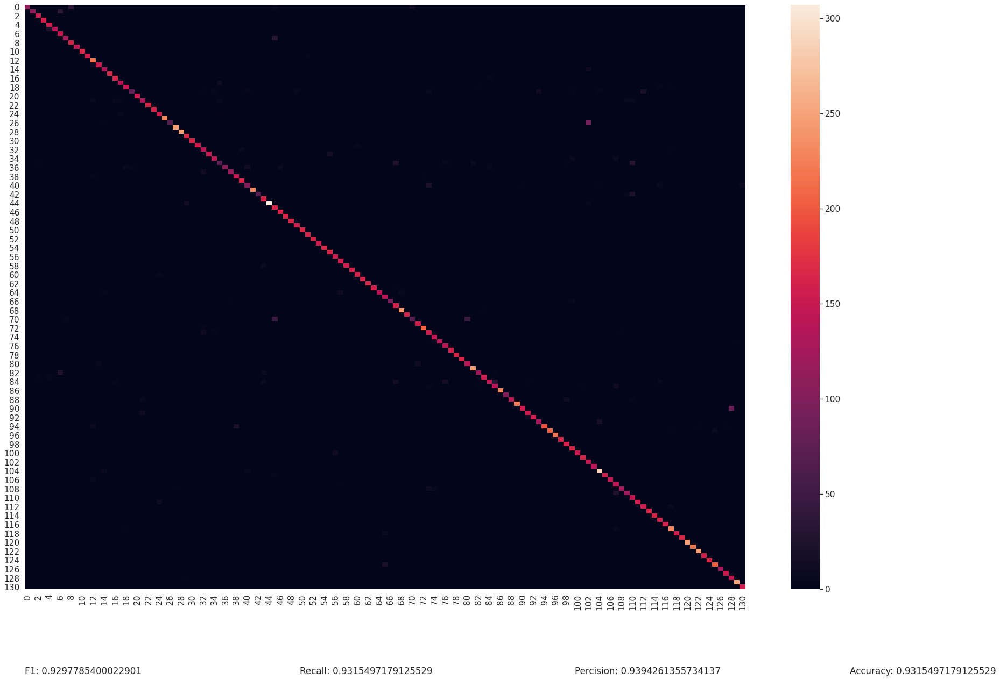

In [364]:
confusionMatrix(dropout_model2)